# Imports

In [1]:
import pandas
import os
import numpy as np
import pathlib
import IPython.display as display
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
import glob
import cv2
import h5py
import tensorflow as tf
from tensorflow.data import Dataset
from google.colab import drive
import time
from skimage.io import imread, imsave
import PIL.Image
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, Flatten, Multiply, MaxPool2D, MaxPooling2D, Dense, Input, Reshape, Concatenate, GlobalAveragePooling2D, BatchNormalization, Dropout, Activation, GlobalMaxPooling2D, concatenate
from tensorflow.keras.utils import Sequence
import os.path
import random
from PIL.JpegImagePlugin import convert_dict_qtables

import gc
from skimage.metrics import structural_similarity
from sklearn.metrics import f1_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import average_precision_score
from sklearn.metrics import confusion_matrix

import gc
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [2]:
%cd '/content/drive/MyDrive/Colab Notebooks (1)/V&P/FinalProject/test'
# %cd '/content/drive/MyDrive/Colab Notebooks/V&P/FinalProject/test'
# %cd '/content/drive/MyDrive/Colab Notebooks/VP/FinalProject/test'
%ls

/content/drive/.shortcut-targets-by-id/1ZoVpjkZ3StCrSSj-XXKogP6yaEIwdK3N/Colab Notebooks/V&P/FinalProject/test
 our_dataset_jpeg_31/              results/              train_our_dataset.h5
 our_dataset_jpeg_31_classifier/   saved_models/
'pytorch development'/             test_our_dataset.h5


## General functions

In [33]:
def show(x, title=None, cbar=False, figsize=None):
    import matplotlib.pyplot as plt
    plt.figure(figsize=figsize)
    plt.imshow(x, interpolation='nearest', cmap='gray')
    if title:
        plt.title(title)
    if cbar:
        plt.colorbar()
    plt.show()


def Im2Patch(img, win, stride=1):
    k = 0
    endc = img.shape[0]
    endw = img.shape[1]
    endh = img.shape[2]
    patch = img[:, 0:endw-win+0+1:stride, 0:endh-win+0+1:stride]
    TotalPatNum = patch.shape[1] * patch.shape[2]
    Y = np.zeros([endc, win*win,TotalPatNum], np.float32)
    for i in range(win):
        for j in range(win):
            patch = img[:,i:endw-win+i+1:stride,j:endh-win+j+1:stride]
            Y[:,k,:] = np.array(patch[:]).reshape(endc, TotalPatNum)
            k = k + 1

    del patch
    del img
    gc.collect()

    return Y.reshape([endc, win, win, TotalPatNum])

def normalize(data):
  return data/255.


def plotConfusionMatrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    cm = confusion_matrix(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    # print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

def plotConfusions(true, predictions):
    np.set_printoptions(precision=2)
    class_names = ["spliced","authentic"]

    plotConfusionMatrix(true, predictions, classes=class_names, normalize=True,
                      title='Normalized confusion matrix')
    plt.show()

#Noiseprint

## Jpeg Analizer Functions

In [4]:
def jpeg_qtableinv(stream, tnum=0, force_baseline=None):
    assert tnum == 0 or tnum == 1, 'Table number must be 0 or 1'

    if force_baseline is None:
        th_high = 32767
    elif force_baseline == 0:
        th_high = 32767
    else:
        th_high = 255

    h = np.asarray(convert_dict_qtables(Image.open(stream).quantization)[tnum]).reshape((8, 8))

    if tnum == 0:
        # This is table 0 (the luminance table):
        t = np.matrix(
             [[16,  11,  10,  16,  24,  40,  51,  61],
              [12,  12,  14,  19,  26,  58,  60,  55],
              [14,  13,  16,  24,  40,  57,  69,  56],
              [14,  17,  22,  29,  51,  87,  80,  62],
              [18,  22,  37,  56,  68, 109, 103,  77],
              [24,  35,  55,  64,  81, 104, 113,  92],
              [49,  64,  78,  87, 103, 121, 120, 101],
              [72,  92,  95,  98, 112, 100, 103,  99]])

    elif tnum == 1:
        # This is table 1 (the chrominance table):
        t = np.matrix(
            [[17,  18,  24,  47,  99,  99,  99,  99],
             [18,  21,  26,  66,  99,  99,  99,  99],
             [24,  26,  56,  99,  99,  99,  99,  99],
             [47,  66,  99,  99,  99,  99,  99,  99],
             [99,  99,  99,  99,  99,  99,  99,  99],
             [99,  99,  99,  99,  99,  99,  99,  99],
             [99,  99,  99,  99,  99,  99,  99,  99],
             [99,  99,  99,  99,  99,  99,  99,  99]])

    else:
        raise ValueError(tnum, 'Table number must be 0 or 1')

    h_down = np.divide((2 * h-1), (2 * t))
    h_up   = np.divide((2 * h+1), (2 * t))
    if np.all(h == 1): return 100
    x_down = (h_down[h > 1]).max()
    x_up   = (h_up[h < th_high]).min() if (h < th_high).any() else None
    if x_up is None:
        s = 1
    elif x_down > 1 and x_up > 1:
        s = np.ceil(50 / x_up)
    elif x_up < 1:
        s = np.ceil(50*(2 - x_up))
    else:
        s = 50
    return s


# *********************** analyze quality jpeg images **************************


directorys = glob.glob("./our_dataset_jpeg_31/train/*")

for i in range(len(directorys)):
    files = glob.glob(os.path.join(directorys[i], "", '*.jpeg'))

    for j in range(len(files)):
        # img = cv2.imread(files[j])
        QF = jpeg_qtableinv(files[j])
        print("Directory: {}    QF:{}".format(files[j],QF))

Directory: ./our_dataset_jpeg_31/train/FUJIFILM_X30/FUJIFILM_X30_4.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/FUJIFILM_X30/FUJIFILM_X30_23.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/FUJIFILM_X30/FUJIFILM_X30_11.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/FUJIFILM_X30/FUJIFILM_X30_12.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/FUJIFILM_X30/FUJIFILM_X30_5.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/FUJIFILM_X30/FUJIFILM_X30_3.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/FUJIFILM_X30/FUJIFILM_X30_2.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/FUJIFILM_X30/FUJIFILM_X30_7.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/FUJIFILM_X30/FUJIFILM_X30_8.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/FUJIFILM_X30/FUJIFILM_X30_6.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/Canon_IXY_30S/Canon_IXY_30S_13.jpeg    QF:31.0
Directory: ./our_dataset_jpeg_31/train/Canon_IXY_30S/Canon_IXY_30S_12.jpeg    QF:

##DATA GENERATOR

###H5 GENERATOR

In [5]:
def test():
    dirs = glob.glob("./our_dataset_jpeg_31/test/*")
    print(dirs)
    print(os.path.basename(dirs[1]))

def delete_h5_created_before():
    h5f = h5py.File('train_our_dataset.h5', 'w')     #h5 creato
    h5f.close()

def prepare_data(data_path, patch_size, stride, curr_dir, aug_times=1):
    print('process training data')


    h5f = h5py.File('train_our_dataset.h5', 'a')     #h5 creato
    train_num = 0
    img_counter = 0
    count_files = 0
    
    print("CURRENT DIR: {}".format(curr_dir))

    # take camera images folders 
    files = glob.glob(os.path.join(curr_dir, "", '*.jpeg'))

    camera_image_list = []
    files = sorted(files)
    
    for j in range(len(files)):

        print("CURRENT FILE NAME: {}".format(files[j]))
        print("I'm execute: {}".format(files[j]))
        img = cv2.imread(files[j])
        print("shape original image {}".format(img.shape))
        h, w, c = img.shape
        Img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        plt.imshow(Img)
        plt.show()
        Img = cv2.resize(img, (int(h), int(w)), interpolation=cv2.INTER_CUBIC)
        Img = np.expand_dims(Img[:,:,0].copy(), 0)
        Img = np.float32(normalize(Img))
        
        patches = Im2Patch(Img, win=patch_size, stride=stride)
        patches = patches[...,:400]
        print("shape patches generated {}".format(patches.shape))
        img_counter += 1

        print("IMAGE COUNTER: {}".format(img_counter))

        camera_image_list.append(patches)
        print(patches.shape)
        del patches
        del Img
        del img
        gc.collect()

        train_num += 1
        
    h5f.create_dataset(str(os.path.basename(curr_dir)), data=camera_image_list)
    camera_image_list = []
    h5f.close()

    print('training set, # samples %d\n' % train_num)

In [6]:
# build the h5

create_h5 = False
if create_h5:
  prepare_data("",40,10,"./our_dataset_jpeg_31/train/Canon_DIGITAL_IXUS_990_IS",1)
  prepare_data("",40,10,"./our_dataset_jpeg_31/train/Canon_EOS_D30",1)
  prepare_data("",40,10,"./our_dataset_jpeg_31/train/Canon_IXY_30S",1)
  prepare_data("",40,10,"./our_dataset_jpeg_31/train/FUJIFILM_FinePix_F30",1)
  prepare_data("",40,10,"./our_dataset_jpeg_31/train/FUJIFILM_X30",1)
  prepare_data("",40,10,"./our_dataset_jpeg_31/train/iPhone_6s",1)


### Read H5

In [7]:
dataset_h5py = h5py.File( "train_our_dataset.h5" , "r")
camera_list = [ cam.encode("utf-8") for cam in list(dataset_h5py.keys()) ]

img = dataset_h5py[camera_list[0]][0,...]
patch = dataset_h5py[camera_list[0]][0,...,10]
print("CAMERA 0 LIST OF IMAGES: {}".format(dataset_h5py[camera_list[0]]))
print(img.shape)
print(patch.shape)

for cam in camera_list:
  print("OBJ CAMERA: {}".format(cam))


def getPatchFromCameraAndPatchIndex(camera_index, image_index, patch_index):
  try:
    return dataset_h5py[camera_list[camera_index]][image_index,...,patch_index]
  except Exception as e:
    return dataset_h5py[camera_list[camera_index]][0,...,patch_index]

CAMERA 0 LIST OF IMAGES: <HDF5 dataset "Canon_DIGITAL_IXUS_990_IS": shape (7, 1, 40, 40, 400), type "<f4">
(1, 40, 40, 400)
(1, 40, 40)
OBJ CAMERA: b'Canon_DIGITAL_IXUS_990_IS'
OBJ CAMERA: b'Canon_EOS_D30'
OBJ CAMERA: b'Canon_IXY_30S'
OBJ CAMERA: b'FUJIFILM_FinePix_F30'
OBJ CAMERA: b'FUJIFILM_X30'
OBJ CAMERA: b'iPhone_6s'


### Batch Generator

In [8]:
def get_batch(information = False, list_of_paches = [], list_of_cameras = []):
  #camera and patch positions are fixed internally in a group, to image taken change

  if list_of_cameras == []:
    print("The batch function works with random")
  else:
    print("The batch function works with 50% positive label")

  images = np.zeros((200,40,40,1))

  if list_of_cameras == []:
    camera_index      = np.random.randint(0,6)
  else:
    camera_index      = list_of_cameras[0]
  
  max_num_of_photo  = dataset_h5py[camera_list[int(camera_index)]].shape[0]
  info = {'model_n':[],'image_n':[],'patch_n':[]}
  image_index      = np.random.randint(0,max_num_of_photo)
  
  batch = []
  for k in range(0,50):
    list_of_patches  = []

    for i in range(0,4):
      info['model_n'].append(int(camera_index))
      info['image_n'].append(image_index)
      info['patch_n'].append(list_of_paches[k])

      temp = dataset_h5py[camera_list[int(camera_index)]][image_index,...,list_of_paches[k]]
      temp = np.moveaxis(temp,0,2)
      images[4*k +i,...] = temp
      image_index      = np.random.randint(0,max_num_of_photo)

    if list_of_cameras == []:
      camera_index      = np.random.randint(0,6)
    else:
      if k < 49:
        camera_index      = list_of_cameras[(k*4)+4]
    max_num_of_photo  = dataset_h5py[camera_list[int(camera_index)]].shape[0]
    image_index      = np.random.randint(0,max_num_of_photo)

  if information:
    print(info)

  return (images,info)

In [9]:
def get_cameras_indeces(start_index, end_index, n_rand_val):
    first_camera_index = np.empty(np.random.randint(start_index,end_index,n_rand_val).shape)
    for i in range(n_rand_val):
        if i % 4 == 0:
            first_camera_index[i]   = np.random.randint(start_index,end_index)
            first_camera_index[i+1] = first_camera_index[i]
            first_camera_index[i+2] = first_camera_index[i]
            first_camera_index[i+3] = first_camera_index[i]

    second_camera_index     = first_camera_index.copy()

    sign = True

    for i in range(n_rand_val):
        if i % 4 == 0:
          if sign:
              sign = False
              for j in range(0,4):
                second_camera_index[i] = first_camera_index[i]
          else:
              sign = True

              rand = np.random.randint(start_index,end_index)
              while True:
                  if rand == first_camera_index[i]:
                      rand = np.random.randint(start_index,end_index)
                  else:
                      break
                  
              second_camera_index[i] = rand
              second_camera_index[i+1] = rand
              second_camera_index[i+2] = rand
              second_camera_index[i+3] = rand
    return (first_camera_index, second_camera_index)

In [10]:
index_list = np.random.randint(0,400,50)

batches = get_cameras_indeces(0,len(camera_list),200)

x1 = get_batch(True, index_list,batches[0])
x2 = get_batch(True, index_list,batches[1])

print(x1[0].shape)

The batch function works with 50% positive label


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


{'model_n': [5, 5, 5, 5, 3, 3, 3, 3, 1, 1, 1, 1, 4, 4, 4, 4, 5, 5, 5, 5, 0, 0, 0, 0, 5, 5, 5, 5, 0, 0, 0, 0, 5, 5, 5, 5, 2, 2, 2, 2, 5, 5, 5, 5, 4, 4, 4, 4, 5, 5, 5, 5, 4, 4, 4, 4, 1, 1, 1, 1, 5, 5, 5, 5, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4, 4, 4, 0, 0, 0, 0, 5, 5, 5, 5, 0, 0, 0, 0, 3, 3, 3, 3, 0, 0, 0, 0, 5, 5, 5, 5, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 4, 4, 4, 5, 5, 5, 5, 1, 1, 1, 1, 4, 4, 4, 4, 5, 5, 5, 5, 3, 3, 3, 3, 5, 5, 5, 5, 1, 1, 1, 1, 4, 4, 4, 4, 2, 2, 2, 2, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 0, 0, 0, 0, 3, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5, 5], 'image_n': [2, 5, 3, 7, 8, 0, 2, 8, 4, 1, 4, 4, 1, 1, 4, 1, 7, 4, 3, 5, 5, 4, 6, 3, 3, 8, 5, 1, 3, 5, 5, 1, 5, 7, 7, 2, 5, 8, 0, 0, 8, 3, 6, 4, 7, 1, 1, 5, 9, 2, 0, 9, 4, 2, 1, 0, 3, 6, 7, 3, 8, 5, 9, 9, 2, 2, 3, 0, 5, 7, 5, 3, 3, 1, 0, 5, 2, 3, 4, 5, 4, 5, 5, 6, 1, 1, 0, 7, 5, 5, 3, 5, 0, 0, 2, 7, 2, 1, 2, 3, 5, 6, 7, 6, 2, 2, 4, 8, 9, 4, 4, 3, 1, 3, 0, 4, 7, 7, 4, 6, 4, 3, 2, 7, 5,

(40, 40, 1)


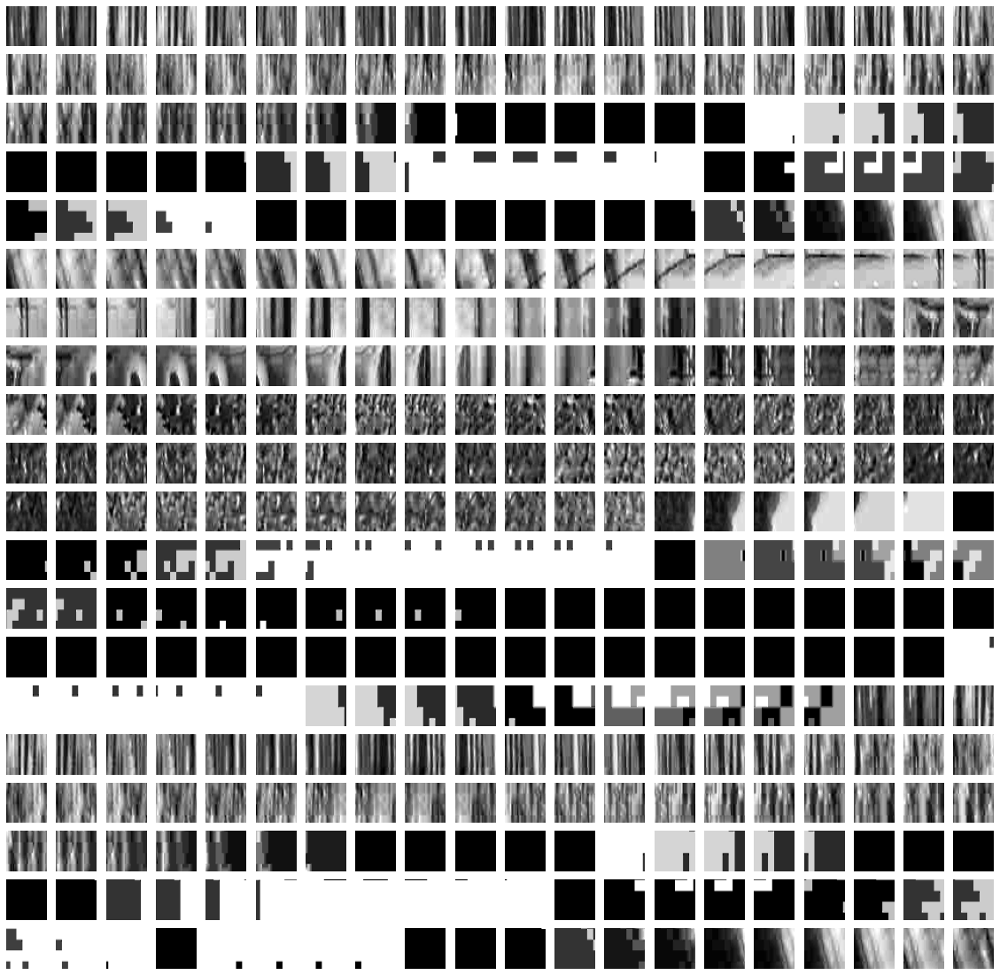

In [11]:
# test of patches generated 

patch = x1[0][2,...]
print(patch.shape)

w = 10
h = 10
fig = plt.figure(figsize=(20, 20))
columns = 20
rows = 20

for i in range(1, 400 + 1):
    #print("I COUNT: {} ".format(i))
    patch = dataset_h5py[camera_list[0]][5,...,i-1]
    patch = np.moveaxis(patch,0,2)
    patch = np.squeeze(patch, 2)
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    plt.imshow(patch,cmap='gray')
plt.show()

## Network

In [12]:
class SiameseEmbedding(Model):
    def __init__(self,batch_size = 200, patch_size = 40):
        super(SiameseEmbedding,self).__init__()


        self.img_inputs = tf.keras.layers.Input(shape=(None, None, 1), dtype='float32')  #batch_size= batch_size,
        # self.img_inputs = tf.keras.layers.Input(shape=None)

        self.model = self.img_inputs

        self.model = Conv2D(64,(3,3), name="Conv1", padding="SAME")(self.model)
        self.model = Activation(tf.nn.relu)(self.model)

        for i in range(0,15):
            self.model = Conv2D(64,(3,3), name="Conv"+str(i+2), padding="SAME")(self.model)
            self.model = BatchNormalization(epsilon=1e-5)(self.model)
            self.model = Activation(tf.nn.relu)(self.model)

        self.model = Conv2D(1,(3,3), name="Conv17", padding="SAME")(self.model)

        self.model = tf.keras.Model(inputs=self.img_inputs, outputs=self.model)

        self._set_inputs(tf.TensorSpec([None,None,None,1], name='inputs'))

    def getModel(self):
      return self.model
      
    def call(self,input):
        return self.model(input)

In [13]:
# test embedding

siamese_embedding = SiameseEmbedding(200,40)
siamese_embedding._set_inputs(tf.TensorSpec([1,256,256,1], name='inputs'))
siamese_embedding.build(input_shape=(1,256,256,1))
out = siamese_embedding.call(np.ones( (1,256,256,1) ))

print(out.shape)
out = siamese_embedding.call(np.ones( (200,40,40,1) ))
print(out.shape)
siamese_embedding.model.summary()

(1, 256, 256, 1)
(200, 40, 40, 1)
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 1)]   0         
_________________________________________________________________
Conv1 (Conv2D)               (None, None, None, 64)    640       
_________________________________________________________________
activation (Activation)      (None, None, None, 64)    0         
_________________________________________________________________
Conv2 (Conv2D)               (None, None, None, 64)    36928     
_________________________________________________________________
batch_normalization (BatchNo (None, None, None, 64)    256       
_________________________________________________________________
activation_1 (Activation)    (None, None, None, 64)    0         
_________________________________________________________________
Conv3 (Conv2D)             

In [14]:
class SiameseModel(Model):
    def __init__(self, siamese_embedding):
        super(SiameseModel, self).__init__()
        self.siamese_embedding = siamese_embedding

        self.optimizer=tf.optimizers.Adam(0.0001)
        self.loss_tracker = tf.keras.metrics.Mean(name="loss")

    def call(self, inputs):
        return self.siamese_embedding.call(inputs)

    def _compute_loss(self, out_desired, out_actual, info_1, info_2):  #batch_1,batch_2

      # initialize the minibatch loss to zero 
      loss = tf.Variable(0 ,dtype= tf.float32)
      
      if verbose:
        print("step4 Batch out 1 {}".format(out_desired.shape))
        print("step4 Batch out 2 {}".format(out_actual.shape))

      # squeeze the pixel intensity values for each patch
      flatten_out_desired = tf.reshape(out_desired,(out_desired.shape[0], -1))
      flatten_out_actual = tf.reshape(out_actual,(out_actual.shape[0], -1))
    
      if verbose:
        print("step5 Batch out 1 {}".format(flatten_out_desired.shape))
        print("step5 Batch out 2 {}".format(flatten_out_actual.shape))
        print(flatten_out_desired)
        print(flatten_out_actual)
      
      loss = 0

      for i in range(200):

        # initialize loss of i-th patch as the squared euclidean  distance with the other batch
        loss_ = tf.reduce_sum( tf.square(flatten_out_desired[i] - flatten_out_actual), -1 )


        if verbose:
          print("step6 distances ij {}".format(loss_.shape))

        # perform the exponentials using distances
        loss_ =  tf.math.exp( - loss_)

        #extract indicies for summation with i != j
        indicies = []
        for j in range(200):
          if j!=i:
            indicies.append([j])

        if verbose:
          pass

        # estimate the i-th probability distribution
        # pi(j) -> paper formula (1)
        loss_ = loss_/tf.math.reduce_sum(
            tf.gather_nd(loss_, indicies),
            axis=None)
      

        # check camera model and patch position to assign positve or negative labels
        positive_lab = []
        for j in range(200):
          if ( (info_1['model_n'][i] == info_2['model_n'][j]) and (info_1['patch_n'][i] == info_2['patch_n'][j]) ):
            positive_lab.append([j])

        positive_lab = tf.constant(positive_lab, dtype=np.int32)


        if verbose:
          print("positive labels len {}".format(positive_lab.shape[0]))
          print(positive_lab)

        if len(positive_lab)>0:
          #i-th patch loss -> paper formula (2)
          loss_ = tf.gather_nd(loss_, positive_lab)

          if verbose:
            print("positive prob shape {}".format(loss_.shape))

          loss_ = tf.reduce_sum(-tf.math.log(loss_))

        else: # no positve labels are present, for this step the error is zero
          loss_ = tf.Variable(0,  dtype= tf.float32)
          
        # mini-batch loss -> paper formula (3)
        loss += loss_

      print("-------------------> loss {}".format(loss))
      return loss  # loss for all the patches

##Training phase

In [15]:
Train = False

In [16]:
if Train == False:

  siamese_embedding = SiameseEmbedding(200,40)
  siamese_embedding.load_weights('./saved_models/weights/')
  siamese           = SiameseModel(siamese_embedding)

In [17]:
if Train:
  initial_epoch = 0
  n_epoch = 200
  n_step = 20
  verbose = False

  print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

  siamese_embedding = SiameseEmbedding(200,40)

  siamese = SiameseModel(siamese_embedding)

  siamese.build(input_shape=(200,40,40,1))

  gpus = tf.config.list_physical_devices('GPU')
  if gpus:
    try:
      tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
      logical_gpus = tf.config.experimental.list_logical_devices('GPU')
      print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
      print(e)

  for epoch in range(initial_epoch, n_epoch):
    print("epoch n* {}".format(epoch))


    epoch_loss = 0
    start_time = time.time()
    n_count = 0;


    for i in range(0,n_step):

        index_list = np.random.randint(0,400,50)
        batches = get_cameras_indeces(0,len(camera_list),200)
        
        desired_batch = get_batch(False,index_list, [])

        actual_batch= get_batch(False,index_list, [])

        print("step n* {}".format(n_count))

        info_batch1 = desired_batch[1]
        info_batch2 = actual_batch[1]
        
        if verbose:
          
          print("step1 Batch1 {}".format(desired_batch[0].shape))
          print("step1 Batch2 {}".format(actual_batch[0].shape))
    
        print("\n *** forward and computing loss *** \n")

        with tf.GradientTape() as tape:
            desired_batch = desired_batch[0]

            actual_batch = actual_batch[0]

            out_desired = siamese.call(desired_batch)

            out_actual = siamese.call(actual_batch)
        
            loss = siamese._compute_loss(out_desired, out_actual, info_batch1, info_batch2)
            # Storing the gradients of the loss function with respect to the
            # weights/parameters.

        if (loss != 0):
          gradients = tape.gradient(loss, siamese.siamese_embedding.trainable_weights)

          # Applying the gradients on the model using the specified optimizer
          siamese.optimizer.apply_gradients(
              zip(gradients, siamese.siamese_embedding.trainable_weights)
          )

          # Let's update and return the training loss metric.
          siamese.loss_tracker.update_state(loss)
          # return {"loss": self.loss_tracker.result()}

          epoch_loss += siamese.loss_tracker.result()
        else:
          print("no positive labels for the step")

        n_count +=1

    elapsed_time = time.time() - start_time

    print('epoch = {} , loss = {} , time = {} [s]'.format(epoch+1, epoch_loss, elapsed_time))

    siamese.siamese_embedding.build((200,40,40,1))

  siamese.siamese_embedding.save('./saved_models/Noiseprint/')
  siamese.siamese_embedding.save_weights("./saved_models/weights/")


## Test phase

FUJIFILM_FinePix_F30_1.jpeg
(1, 2136, 2848, 1)


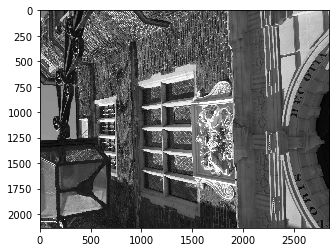

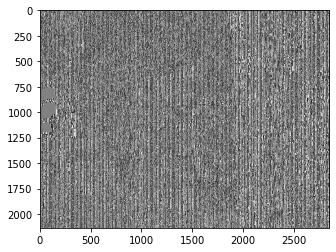

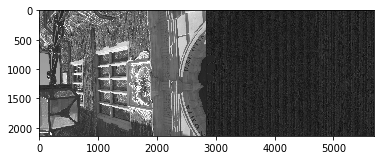

SISM_APPEND: 0.1354127538908024
FUJIFILM_FinePix_F30_9.jpeg
(1, 2136, 2848, 1)


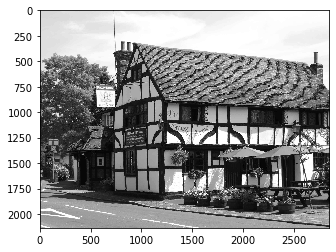

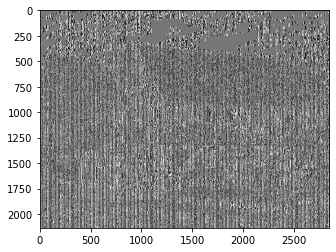

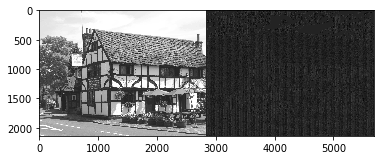

SISM_APPEND: 0.11825767591402933
FUJIFILM_FinePix_F30_0.jpeg
(1, 2136, 2848, 1)


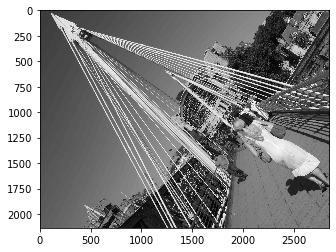

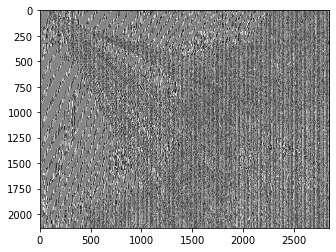

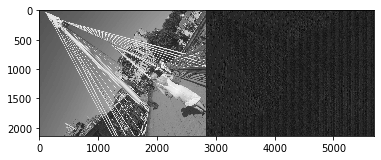

SISM_APPEND: 0.11577663810060873
FUJIFILM_FinePix_F30_110.jpeg
(1, 2136, 2848, 1)


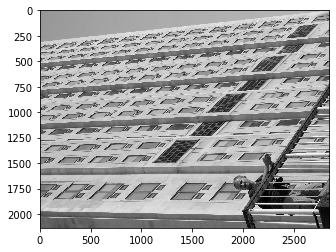

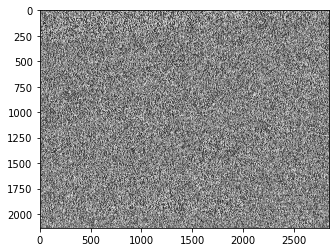

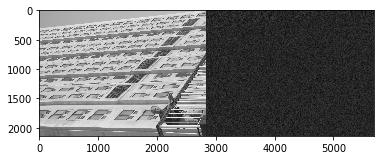

SISM_APPEND: 0.06735144889515403
FUJIFILM_FinePix_F30_111.jpeg
(1, 2136, 2848, 1)


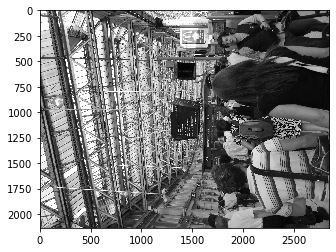

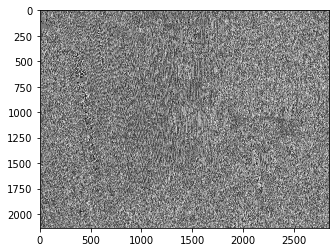

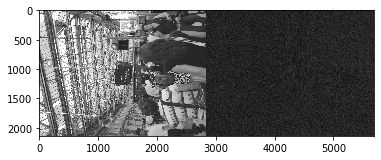

SISM_APPEND: 0.1478645427019247
FUJIFILM_FinePix_F30_112.jpeg
(1, 2136, 2848, 1)


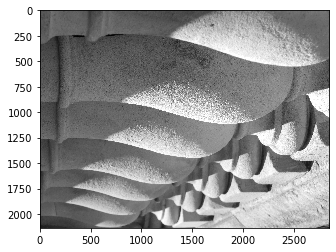

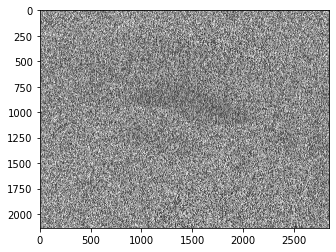

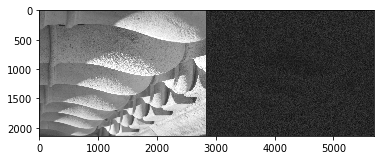

SISM_APPEND: 0.0888137440137315
FUJIFILM_X30_9.jpeg
(1, 3000, 4000, 1)
OOM when allocating tensor with shape[1,64,3000,4000] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Conv2D]
FUJIFILM_X30_1.jpeg
(1, 3000, 4000, 1)
OOM when allocating tensor with shape[1,64,3000,4000] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Conv2D]
FUJIFILM_X30_0.jpeg
(1, 3000, 4000, 1)
OOM when allocating tensor with shape[1,64,3000,4000] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Conv2D]
Canon_EOS_D30_0.jpeg
(1, 1440, 2160, 1)


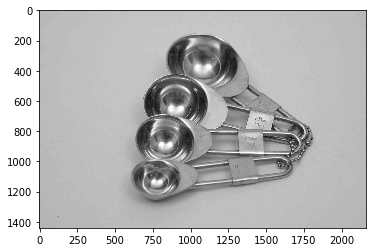

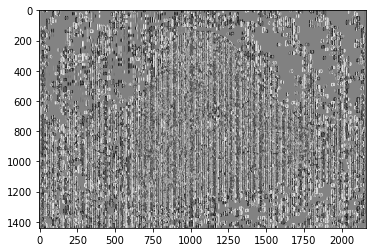

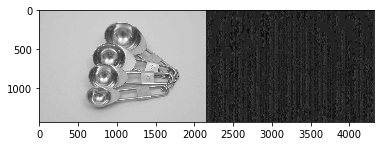

SISM_APPEND: 0.06632452584493938
Canon_EOS_D30_1.jpeg
(1, 1440, 2160, 1)


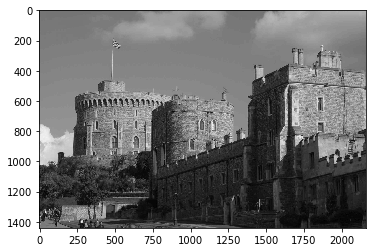

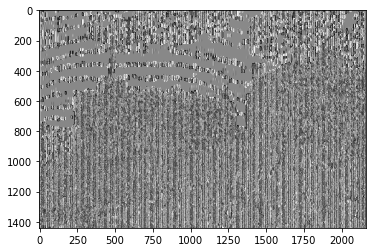

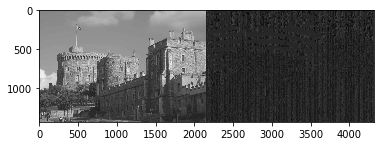

SISM_APPEND: 0.16005760078236717
Canon_EOS_D30_9.jpeg
(1, 1440, 2160, 1)


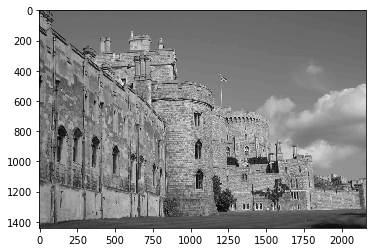

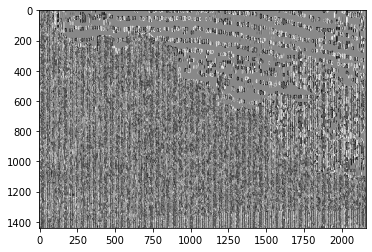

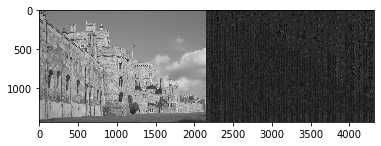

SISM_APPEND: 0.09201276703402476
iPhone_6s_2.jpeg
(1, 3024, 4032, 1)
OOM when allocating tensor with shape[1,64,3024,4032] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Conv2D]
iPhone_6s_0.jpeg
(1, 3024, 4032, 1)
OOM when allocating tensor with shape[1,64,3024,4032] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Conv2D]
iPhone_6s_1.jpeg
(1, 3024, 4032, 1)
OOM when allocating tensor with shape[1,64,3024,4032] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:Conv2D]
Canon_IXY_30S_0.jpeg
(1, 2736, 3648, 1)


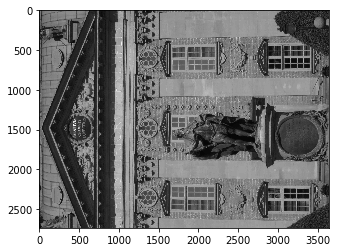

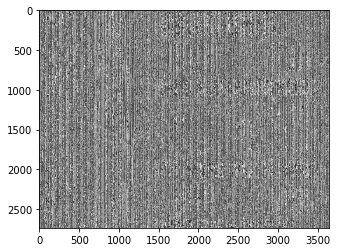

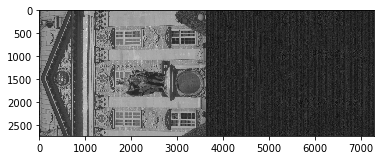

SISM_APPEND: 0.13969110077838653
Canon_IXY_30S_1.jpeg
(1, 2736, 3648, 1)


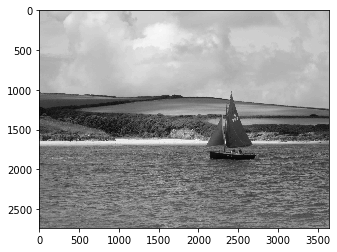

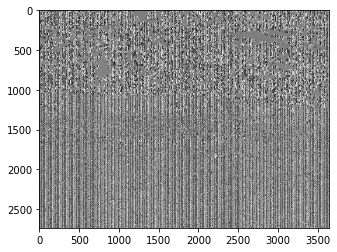

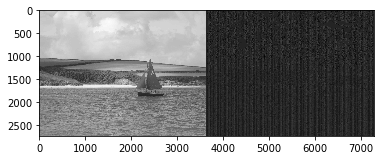

SISM_APPEND: 0.08262977899263253
Canon_IXY_30S_9.jpeg
(1, 2736, 3648, 1)


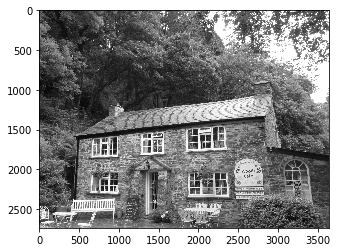

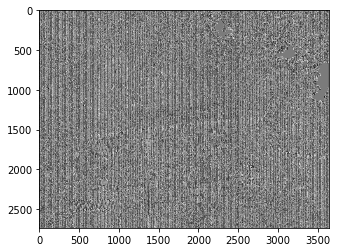

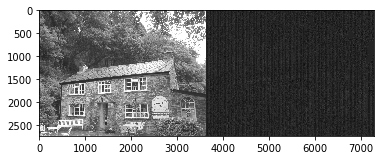

SISM_APPEND: 0.10311502339727215
SSIM = 0.10977563336215611


In [19]:
directorys = glob.glob("./our_dataset_jpeg_31/test/*")
ssims = []


def save_result(result, path):
    path = path if path.find('.') != -1 else path+'.png'
    ext = os.path.splitext(path)[-1]
    if ext in ('.txt', '.dlm'):
        np.savetxt(path, result, fmt='%2.4f')
    else:
        # imsave(path, np.clip(result, 0, 1))
        imsave(path, result)


for i in range(len(directorys)):
    files = glob.glob(os.path.join(directorys[i], "", '*.jpeg'))

    for img_name in os.listdir(directorys[i]): #folder
      print(img_name)
      try:
        x = np.array(imread(os.path.join(directorys[i],img_name)), dtype=np.float32)/255.0 # folder
      except Exception as e:
        print(e)
        continue
      x = cv2.cvtColor(x, cv2.COLOR_RGB2GRAY)

      width = x.shape[0]
      height = x.shape[1]

      x = np.expand_dims(x,axis= 0) # add dimension for batch
      x = np.expand_dims(x,axis= -1) # add dimension for color channel

      siamese.siamese_embedding._set_inputs(tf.TensorSpec([1,width,height,1], name='inputs'))

      siamese.siamese_embedding.build(input_shape=(1,width,height,1))

      print(x.shape)
      try:
        out = siamese.call(x)
        out = np.array(out,dtype = np.float32)
        out = np.squeeze(out,0)
        out = np.squeeze(out,-1)

        x_mod = x.copy()
        x_mod = np.squeeze(x_mod,0)
        x_mod = np.squeeze(x_mod,-1)
        ssim_x_ = structural_similarity(x_mod, out,multichannel=False)
        ssims.append(ssim_x_)  # save the values for the structural similarity

        show(x_mod)

        show(out)
        imsave("./results/Noiseprint/noise_images/" + img_name, out)  # save the output image
        
        stacked_images = np.hstack((x_mod, out))
        show(stacked_images)  # show the image
        imsave("./results/Noiseprint/comparison/" + img_name, stacked_images)  # save the output image

        print("SISM_APPEND: {}".format(ssim_x_))
      except Exception as e:
        print(e)
        pass

ssim_avg = np.mean(ssims)
save_result(ssims, path=os.path.join("./results/Noiseprint/", "", 'results.txt'))
print('SSIM = {}'.format(ssim_avg))

## Generate noise residual for classification

1_a.jpeg
(1, 1500, 2000, 1)


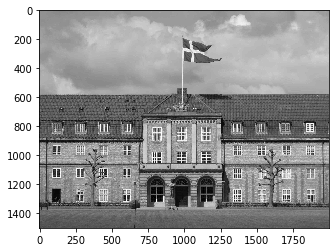

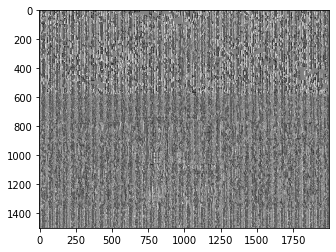

structural similarity -> 0.06172862359610149
1_f.jpg
(1, 1500, 2000, 1)


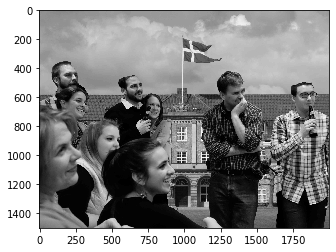

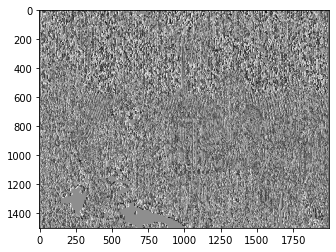

structural similarity -> 0.15741634688966005
2_a.jpeg
(1, 1500, 2000, 1)


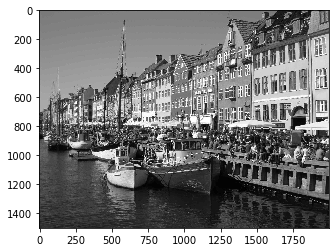

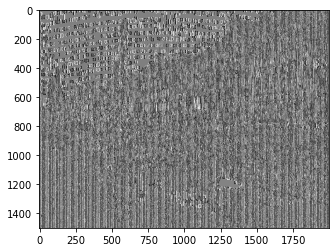

structural similarity -> 0.11385085891679297
2_f.jpg
(1, 1500, 2000, 1)


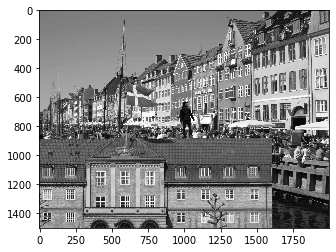

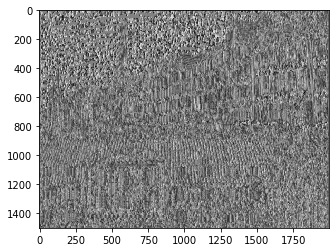

structural similarity -> 0.0782403757357106
3_a.jpeg
(1, 1500, 2000, 1)


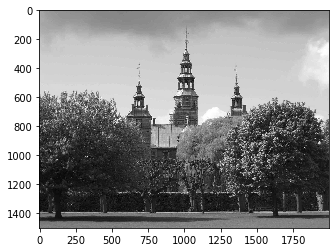

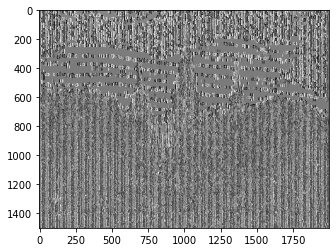

structural similarity -> 0.10854743765399122
3_f.jpg
(1, 1500, 2000, 1)


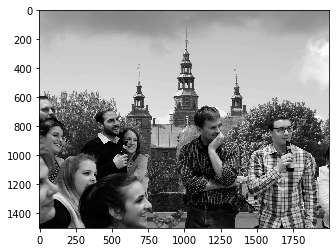

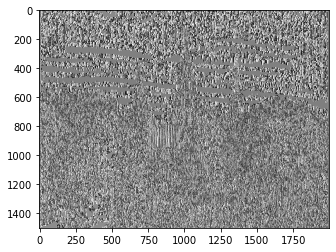

structural similarity -> 0.11307185138075694
4_a.jpeg
(1, 1500, 2000, 1)


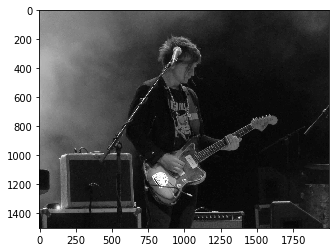

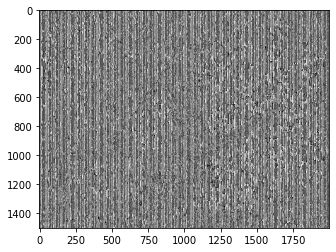

structural similarity -> 0.3598951458297534
4_f.jpg
(1, 1500, 2000, 1)


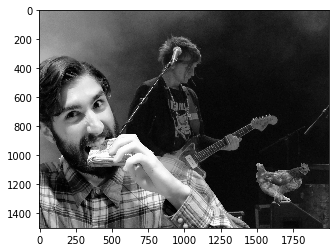

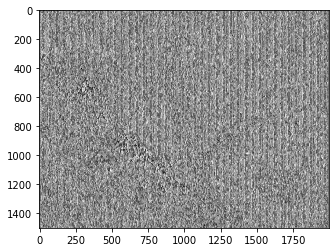

structural similarity -> 0.34448046206666555
5_a.jpeg
(1, 1500, 2000, 1)


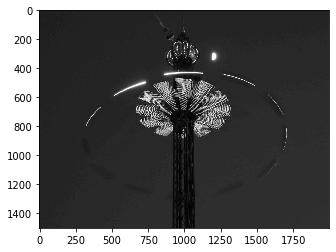

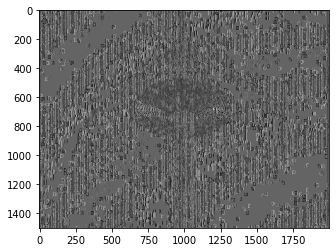

structural similarity -> 0.3150373011288135
5_f.jpg
(1, 1500, 2000, 1)


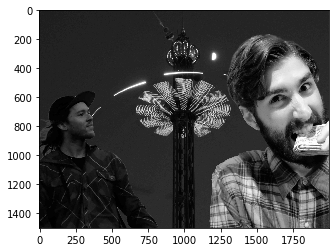

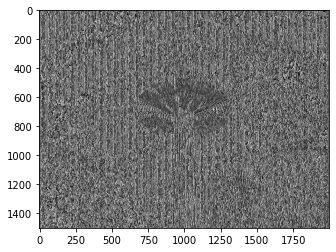

structural similarity -> 0.3014108476197402
6_a.jpeg
(1, 1500, 2000, 1)


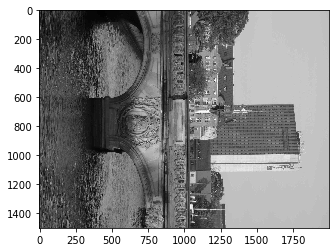

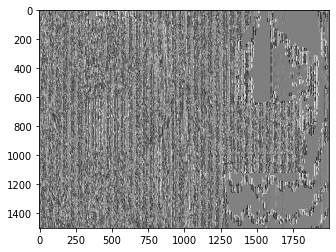

structural similarity -> 0.09592836827500897
6_f.jpg
(1, 1500, 2000, 1)


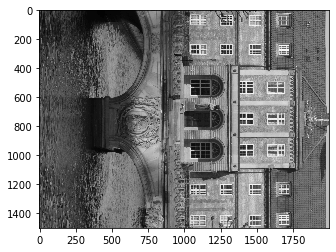

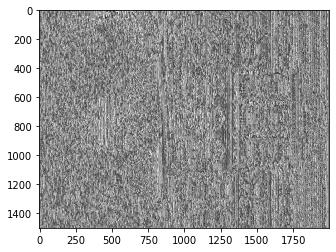

structural similarity -> 0.0957836030987499
7_a.jpeg
(1, 1500, 2000, 1)


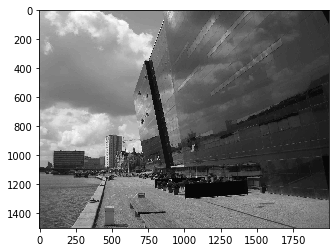

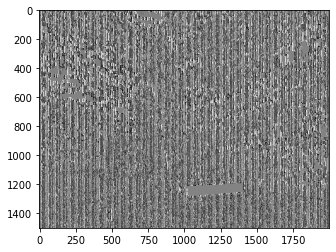

structural similarity -> 0.15059240442563185
7_f.jpg
(1, 1500, 2000, 1)


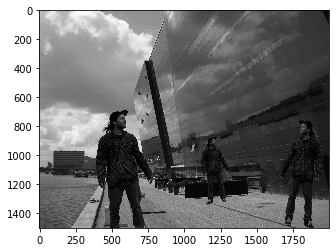

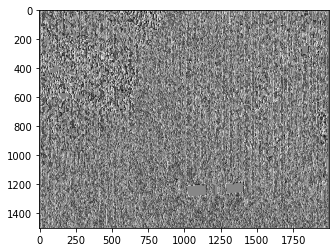

structural similarity -> 0.19172920332303292
8_a.jpeg
(1, 1068, 1424, 1)


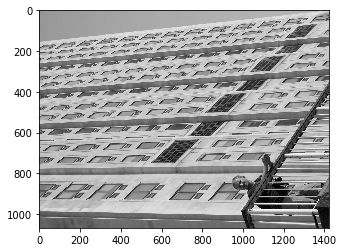

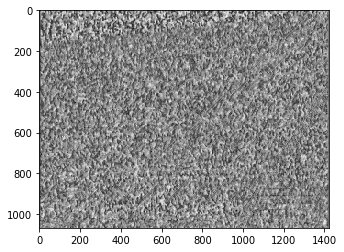

structural similarity -> 0.0519206376896513
8_f.jpg
(1, 1068, 1424, 1)


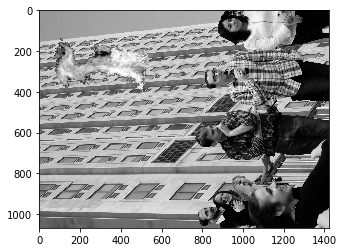

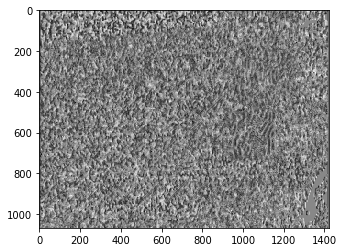

structural similarity -> 0.09972727255925923
9_a.jpeg
(1, 1068, 1424, 1)


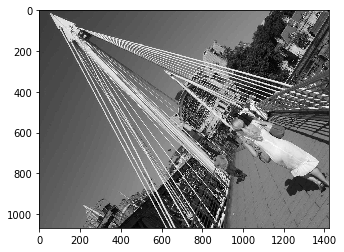

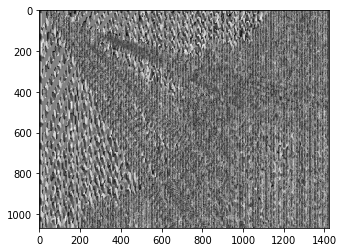

structural similarity -> 0.08821077812146873
9_f.jpg
(1, 1068, 1424, 1)


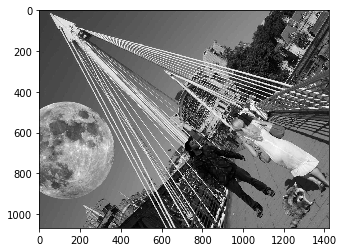

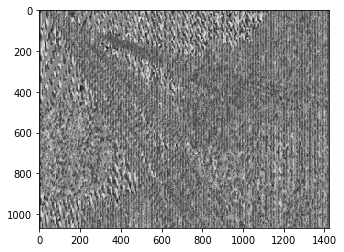

structural similarity -> 0.09161595881532128


In [20]:
for img_name in sorted(os.listdir("./our_dataset_jpeg_31_classifier/train/")): #folder

      print(img_name)
      try:
        x = np.array(imread(os.path.join("./our_dataset_jpeg_31_classifier/train/",img_name)), dtype=np.float32)/255.0 # folder
      except Exception as e:
        print(e)
        continue
      x = cv2.cvtColor(x, cv2.COLOR_RGB2GRAY)

      width = x.shape[0]
      height = x.shape[1]

      x = np.expand_dims(x,axis= 0) # add dimension for batch
      x = np.expand_dims(x,axis= -1) # add dimension for color channel

      siamese.siamese_embedding._set_inputs(tf.TensorSpec([1,width,height,1], name='inputs'))

      siamese.siamese_embedding.build(input_shape=(1,width,height,1))

      print(x.shape)
      try:

        out = siamese.call(x)
        out = np.array(out,dtype = np.float32)
        out = np.squeeze(out,0)
        out = np.squeeze(out,-1)

        x_mod = x.copy()
        x_mod = np.squeeze(x_mod,0)
        x_mod = np.squeeze(x_mod,-1)


        show(x_mod)

        show(out)
        imsave("./our_dataset_jpeg_31_classifier/train_from_noiseprint/" + img_name, out)  # save the output image

        ssim_x_ = structural_similarity(x_mod, out,multichannel=False)
        print("structural similarity -> {}".format(ssim_x_))

      except Exception as e:
        print(e)
        pass


1_a.jpeg
(1, 1500, 2000, 1)


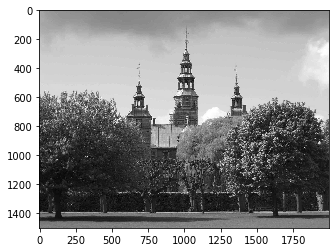

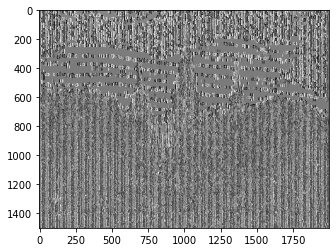

structural similarity -> 0.10854743765399122
1_f.jpg
(1, 1500, 2000, 1)


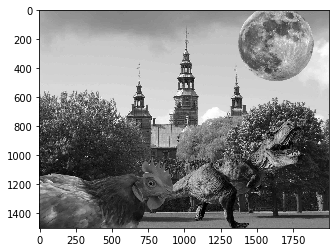

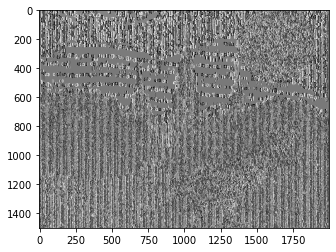

structural similarity -> 0.10027917967049695
2_a.jpeg
(1, 1368, 1824, 1)


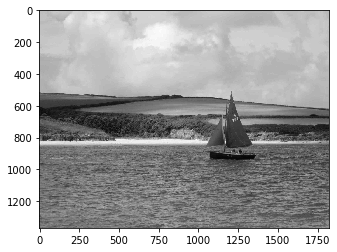

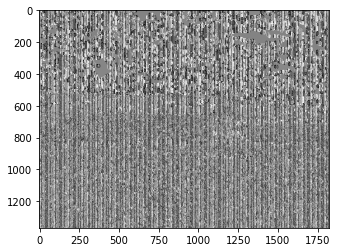

structural similarity -> 0.07136433889022009
2_f.jpg
(1, 1368, 1824, 1)


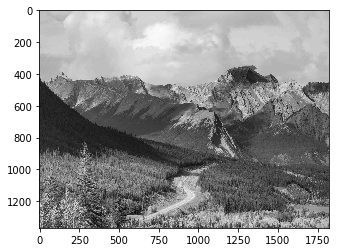

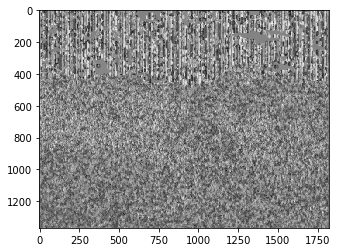

structural similarity -> 0.07538034418400301
3_a.jpeg
(1, 1368, 1824, 1)


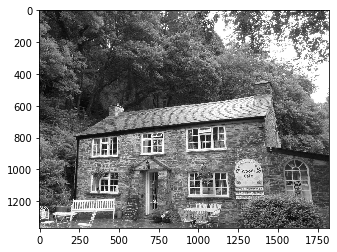

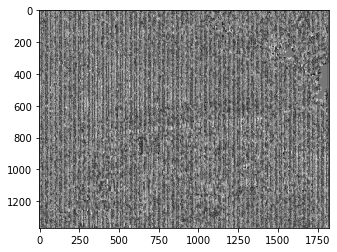

structural similarity -> 0.07744176113419975
3_f.jpg
(1, 1368, 1824, 1)


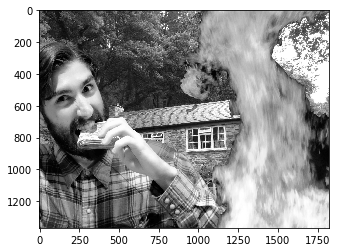

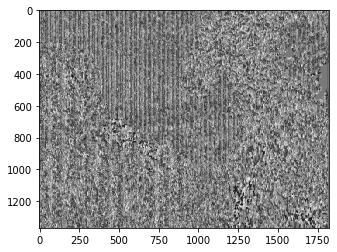

structural similarity -> 0.10162607429626212
4_a.jpeg
(1, 1500, 2000, 1)


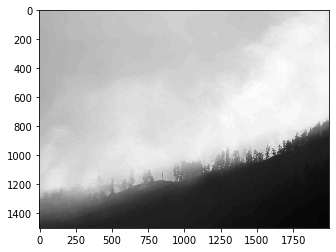

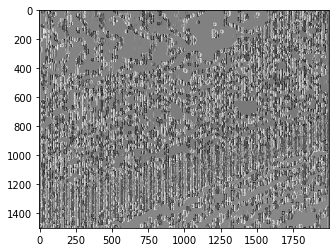

structural similarity -> 0.14868329355213705
4_f.jpg
(1, 1500, 2000, 1)


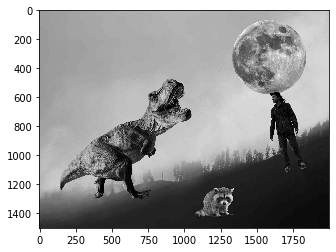

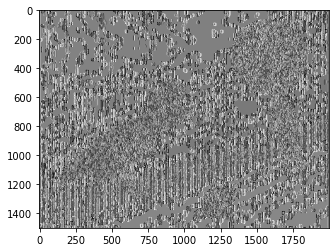

structural similarity -> 0.15346618947201843
5_a.jpeg
(1, 1500, 2000, 1)


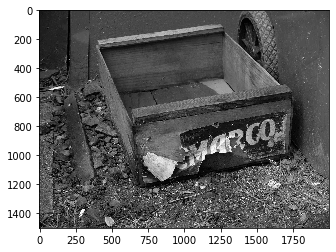

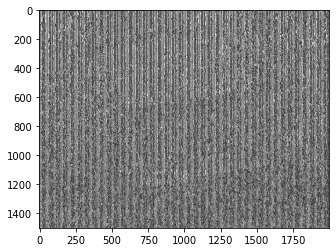

structural similarity -> 0.11930881418314253
5_f.jpg
(1, 1500, 2000, 1)


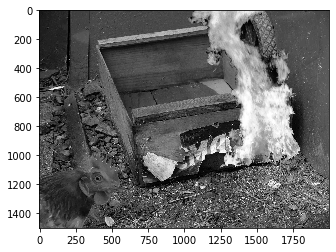

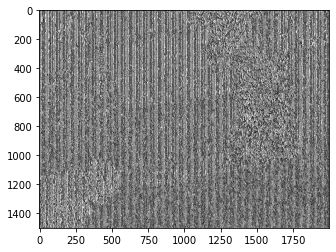

structural similarity -> 0.11675729954028029
6_a.jpeg
(1, 1068, 1424, 1)


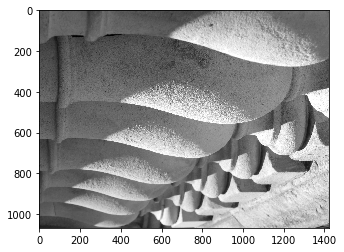

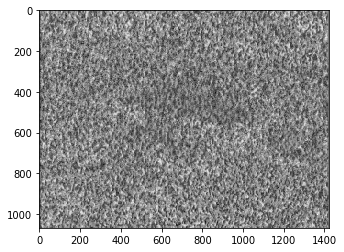

structural similarity -> 0.08192530047381755
6_f.jpg
(1, 1068, 1424, 1)


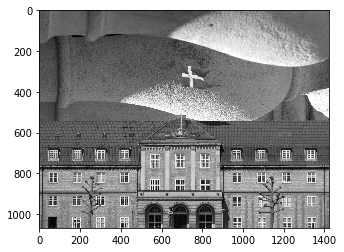

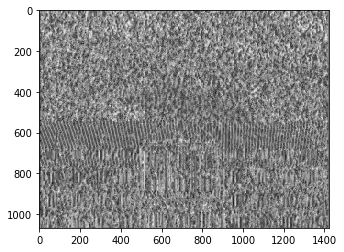

structural similarity -> 0.0640627506354731


In [21]:
for img_name in sorted(os.listdir("./our_dataset_jpeg_31_classifier/test/")):

      print(img_name)
      try:
        x = np.array(imread(os.path.join("./our_dataset_jpeg_31_classifier/test/",img_name)), dtype=np.float32)/255.0 # folder
      except Exception as e:
        print(e)
        continue
      x = cv2.cvtColor(x, cv2.COLOR_RGB2GRAY)

      width = x.shape[0]
      height = x.shape[1]

      x = np.expand_dims(x,axis= 0) # add dimension for batch
      x = np.expand_dims(x,axis= -1) # add dimension for color channel

      siamese.siamese_embedding._set_inputs(tf.TensorSpec([1,width,height,1], name='inputs'))

      siamese.siamese_embedding.build(input_shape=(1,width,height,1))

      print(x.shape)
      try:

        out = siamese.call(x)
        out = np.array(out,dtype = np.float32)
        out = np.squeeze(out,0)
        out = np.squeeze(out,-1)

        x_mod = x.copy()
        x_mod = np.squeeze(x_mod,0)
        x_mod = np.squeeze(x_mod,-1)


        show(x_mod)

        show(out)
        imsave("./our_dataset_jpeg_31_classifier/test_from_noiseprint/" + img_name, out)  # save the output image

        ssim_x_ = structural_similarity(x_mod, out,multichannel=False)
        print("structural similarity -> {}".format(ssim_x_))
        

      except Exception as e:
        print(e)
        pass

#Forgery classification

##Generate all the patches and labels

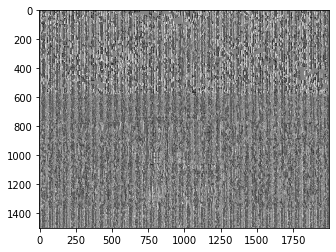

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
authentic image!


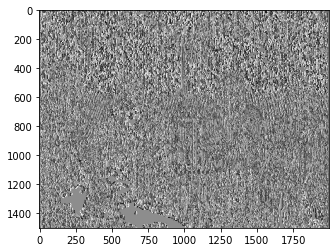

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
spliced image!


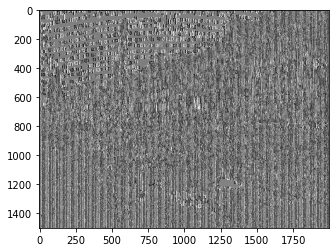

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
authentic image!


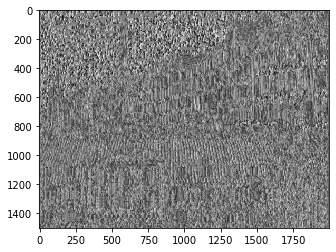

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
spliced image!


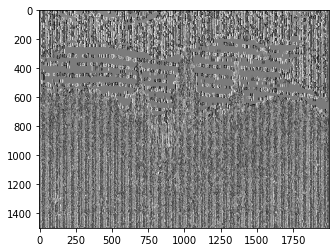

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
authentic image!


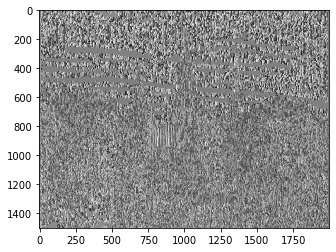

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
spliced image!


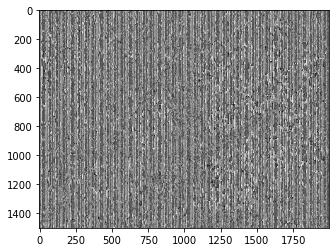

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
authentic image!


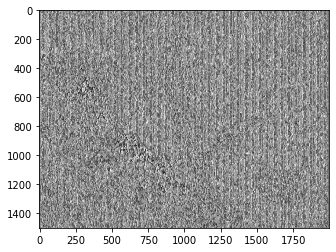

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
spliced image!


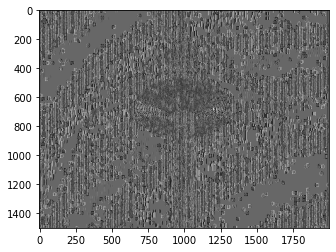

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
authentic image!


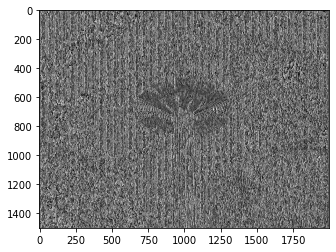

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
spliced image!


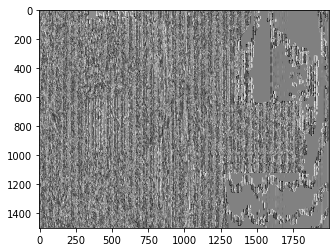

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
authentic image!


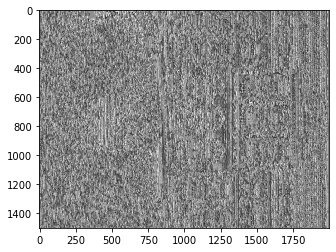

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
spliced image!


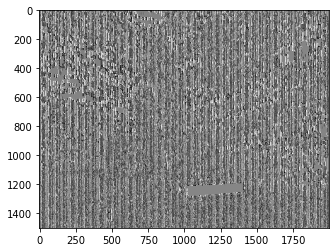

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
authentic image!


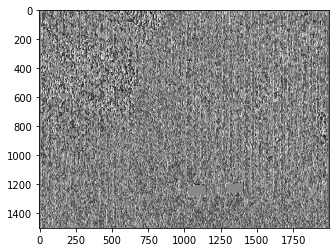

image shape (1, 1500, 2000)
patches shape (1271, 48, 48, 1)
spliced image!


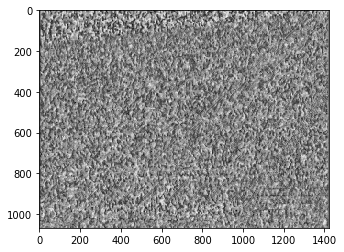

image shape (1, 1068, 1424)
patches shape (638, 48, 48, 1)
authentic image!


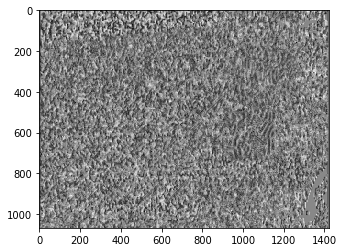

image shape (1, 1068, 1424)
patches shape (638, 48, 48, 1)
spliced image!


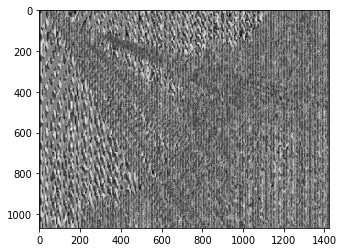

image shape (1, 1068, 1424)
patches shape (638, 48, 48, 1)
authentic image!


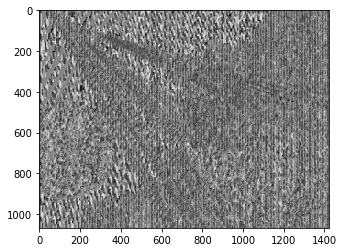

image shape (1, 1068, 1424)
patches shape (638, 48, 48, 1)
spliced image!


In [22]:
patches_list_authentic=[]  # list that contains list of patches of images
patches_list_spliced=[]

directorys = glob.glob("./our_dataset_jpeg_31_classifier/train_from_noiseprint/*")   # use result images for this

directorys = sorted(directorys)

# take spliced images and check which patch has been falsified

label = "authentic"

for i in range(len(directorys)):

  img = cv2.imread(directorys[i])

  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  
  show(img)
  img = np.expand_dims(img,axis=0)
  print("image shape {}".format(img.shape))

  img = np.float32(normalize(img))

  patches = Im2Patch(img,48,48) # no overlapping

  patches = np.moveaxis(patches,3,0)
  patches = np.moveaxis(patches,1,3)

  print("patches shape {}".format(patches.shape))

  if label == "authentic":
    patches_list_authentic.append(patches)
    print("authentic image!")
    label = "spliced"
  else:
    patches_list_spliced.append(patches)
    print("spliced image!")
    label = "authentic"

##Batch generator 

In [23]:
def get_batch(step):
  type_patches = step%2

  patches = None

  if (type_patches == 0):
    print("authentic, index {}".format(int(step/2) ))
    patches = patches_list_authentic[int(step/2)]
    labels = [1] *  patches.shape[0]
  else:
    print("spliced, index {}".format(int(step//2) ))
    patches = patches_list_spliced[int( step//2)]
    labels = [0] *  patches.shape[0]

  return (patches,labels)

In [24]:
for i in range(18):
  val = get_batch(i)
  print(len(val[1]))

authentic, index 0
1271
spliced, index 0
1271
authentic, index 1
1271
spliced, index 1
1271
authentic, index 2
1271
spliced, index 2
1271
authentic, index 3
1271
spliced, index 3
1271
authentic, index 4
1271
spliced, index 4
1271
authentic, index 5
1271
spliced, index 5
1271
authentic, index 6
1271
spliced, index 6
1271
authentic, index 7
638
spliced, index 7
638
authentic, index 8
638
spliced, index 8
638


##Network

In [25]:
input = Input(shape = (48,48,1), name = 'Feauture_extractor_input')
model = input
for i in range(2):
    model = Conv2D(8*2**i, kernel_size = (3,3), activation = 'linear')(model)
    model = BatchNormalization()(model)
    model = Activation('relu')(model)
    model = Conv2D(16*2**i, kernel_size = (3,3), activation = 'linear')(model)
    model = BatchNormalization()(model)
    model = Activation('relu')(model)
    model = MaxPool2D((2,2))(model)
model = Flatten()(model)
model = Dense(32, activation = 'linear')(model)
model = Dropout(0.5)(model)
model = BatchNormalization()(model)
model = Activation('relu')(model)
feature_extractor_model = Model(inputs = [input], outputs = [model], name = 'Feauture_extractor')
feature_extractor_model.summary()

Model: "Feauture_extractor"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Feauture_extractor_input (In [(None, 48, 48, 1)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 46, 46, 8)         80        
_________________________________________________________________
batch_normalization_30 (Batc (None, 46, 46, 8)         32        
_________________________________________________________________
activation_32 (Activation)   (None, 46, 46, 8)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 44, 44, 16)        1168      
_________________________________________________________________
batch_normalization_31 (Batc (None, 44, 44, 16)        64        
_________________________________________________________________
activation_33 (Activation)   (None, 44, 44, 16) 

In [26]:
img_1 = Input(shape = (48,48,1), name = 'patchA_Input')
img_2 = Input(shape = (48,48,1), name = 'patchB_Input')

features_1 = feature_extractor_model(img_1)
features_2 = feature_extractor_model(img_2)

combined_features = concatenate([features_1, features_2], name = 'merge_features')
combined_features = Dense(16, activation = 'linear')(combined_features)
combined_features = BatchNormalization()(combined_features)
combined_features = Activation('relu')(combined_features)
combined_features = Dense(4, activation = 'linear')(combined_features)
combined_features = BatchNormalization()(combined_features)
combined_features = Activation('relu')(combined_features)
combined_features = Dense(1, activation = 'sigmoid')(combined_features)

similarityModel = Model(inputs = [img_1, img_2], outputs = [combined_features], name = 'Similarity_network')
similarityModel.summary()

Model: "Similarity_network"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
patchA_Input (InputLayer)       [(None, 48, 48, 1)]  0                                            
__________________________________________________________________________________________________
patchB_Input (InputLayer)       [(None, 48, 48, 1)]  0                                            
__________________________________________________________________________________________________
Feauture_extractor (Functional) (None, 32)           91600       patchA_Input[0][0]               
                                                                 patchB_Input[0][0]               
__________________________________________________________________________________________________
merge_features (Concatenate)    (None, 64)           0           Feauture_extract

In [27]:
class ClassificationModel(Model):
    def __init__(self, classificator_embedding):
        super(ClassificationModel, self).__init__()
        self.classificator_embedding = classificator_embedding
        # self.distance_layer = distance_layer

        self.optimizer=tf.optimizers.Adam(0.0001)
        self.loss_tracker = tf.keras.metrics.Mean(name="loss")
        self.loss_function = tf.keras.losses.BinaryCrossentropy()

    def call(self, inputs):
        return self.classificator_embedding(inputs)

    def train_step(self, batch_1, batch_2, info_1, info_2):

        with tf.GradientTape() as tape:
          
            loss = self._compute_loss(batch_1, batch_2)

        gradients = tape.gradient(loss, self.siamese_embedding.trainable_weights)

        # Applying the gradients on the model using the specified optimizer
        self.optimizer.apply_gradients(
            zip(gradients, self.siamese_embedding.trainable_weights)
        )

        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, out, labels):
      out = tf.squeeze(out)
      print(out.shape)
      loss = self.loss_function(labels, out)

      self.loss_tracker.update_state(loss)

      return loss 

In [28]:
# forward and loss computation test

classifier = ClassificationModel(similarityModel)
out = classifier.call([np.ones((40,48,48,1)),np.ones((40,48,48,1))])
print(out.shape)
loss = classifier._compute_loss(out,np.ones(40))
print(loss)

(40, 1)
(40,)
tf.Tensor(0.69486433, shape=(), dtype=float32)


##Training phase

In [29]:
Train = False

In [30]:
model_save_folder = './saved_models/Classifier/'
wights_save_folder = './saved_models/Classifier_weights/'

if Train == False:
  classifier = ClassificationModel(similarityModel)
  classifier.classificator_embedding.load_weights(wights_save_folder)


if Train:
  initial_epoch = 0
  n_epoch = 150
  n_step = 18  # number of images * 2 (2 couples one spliced and another authentic)

  verbose = True

  print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

  classifier = ClassificationModel(similarityModel)

  gpus = tf.config.list_physical_devices('GPU')
  if gpus:
    # Restrict TensorFlow to only use the first GPU
    try:
      tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
      logical_gpus = tf.config.experimental.list_logical_devices('GPU')
      print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
      # Visible devices must be set before GPUs have been initialized
      print(e)

  for epoch in range(initial_epoch, n_epoch):
    print("epoch n* {}".format(epoch))

    epoch_loss = 0

    start_time = time.time()
    n_count = 0;


    for i in range(0,n_step):

        patch = get_batch(i)
        labels = np.array(patch[1])


        patch = patch[0]
        batch = [patch,patch]
        # labels = np.ones(40)
        
        print("step n* {}".format(n_count))
        print( "actual label for the step: -> {}".format(labels[0]) )
    
        print("\n *** forward and computing loss *** \n")

        with tf.GradientTape() as tape:
            out = classifier.call(batch)
        
            loss = classifier._compute_loss(out,labels)

            print(loss)

        gradients = tape.gradient(loss, classifier.classificator_embedding.trainable_weights)

        classifier.optimizer.apply_gradients(
            zip(gradients, classifier.classificator_embedding.trainable_weights)
        )

        classifier.loss_tracker.update_state(loss)

        epoch_loss += classifier.loss_tracker.result()

        n_count +=1

    elapsed_time = time.time() - start_time

    print('epoch = {} , loss = {} , time = {} [s]'.format(epoch+1, epoch_loss, elapsed_time))

  classifier.classificator_embedding.save(model_save_folder)
  classifier.classificator_embedding.save_weights(wights_save_folder)

##Test phase

./our_dataset_jpeg_31_classifier/train_from_noiseprint/1_a.jpeg
1_a.jpeg


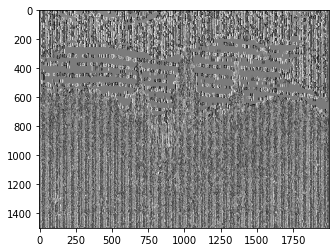

(1500, 2000)
(1, 1500, 2000, 1)
(1271, 48, 48, 1)
(1271,)
tf.Tensor(0.8378628, shape=(), dtype=float32)
1_f.jpg


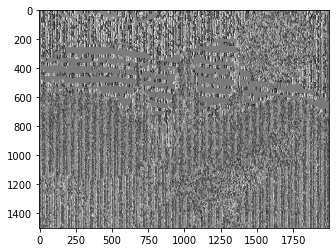

(1500, 2000)
(1, 1500, 2000, 1)
(1271, 48, 48, 1)
(1271,)
tf.Tensor(0.6377228, shape=(), dtype=float32)
2_a.jpeg


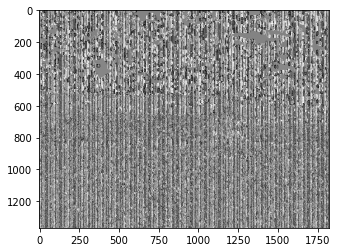

(1368, 1824)
(1, 1368, 1824, 1)
(1064, 48, 48, 1)
(1064,)
tf.Tensor(0.85847276, shape=(), dtype=float32)
2_f.jpg


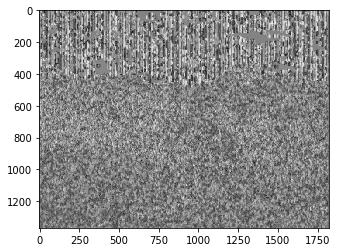

(1368, 1824)
(1, 1368, 1824, 1)
(1064, 48, 48, 1)
(1064,)
tf.Tensor(0.38516432, shape=(), dtype=float32)
3_a.jpeg


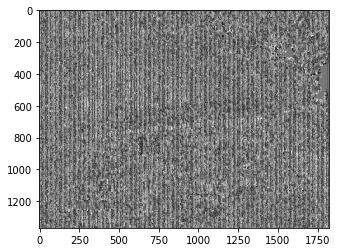

(1368, 1824)
(1, 1368, 1824, 1)
(1064, 48, 48, 1)
(1064,)
tf.Tensor(0.7750542, shape=(), dtype=float32)
3_f.jpg


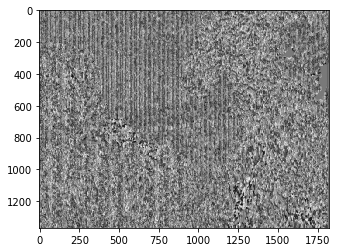

(1368, 1824)
(1, 1368, 1824, 1)
(1064, 48, 48, 1)
(1064,)
tf.Tensor(0.37487873, shape=(), dtype=float32)
4_a.jpeg


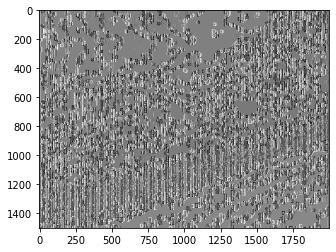

(1500, 2000)
(1, 1500, 2000, 1)
(1271, 48, 48, 1)
(1271,)
tf.Tensor(0.81078917, shape=(), dtype=float32)
4_f.jpg


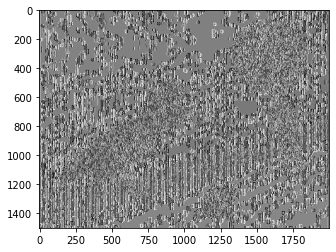

(1500, 2000)
(1, 1500, 2000, 1)
(1271, 48, 48, 1)
(1271,)
tf.Tensor(0.63078195, shape=(), dtype=float32)
5_a.jpeg


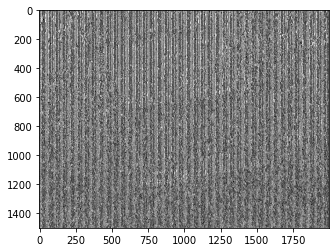

(1500, 2000)
(1, 1500, 2000, 1)
(1271, 48, 48, 1)
(1271,)
tf.Tensor(0.86499715, shape=(), dtype=float32)
5_f.jpg


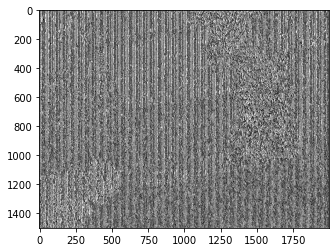

(1500, 2000)
(1, 1500, 2000, 1)
(1271, 48, 48, 1)
(1271,)
tf.Tensor(0.7216006, shape=(), dtype=float32)
6_a.jpeg


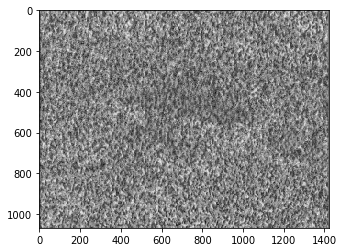

(1068, 1424)
(1, 1068, 1424, 1)
(638, 48, 48, 1)
(638,)
tf.Tensor(0.17875807, shape=(), dtype=float32)
6_f.jpg


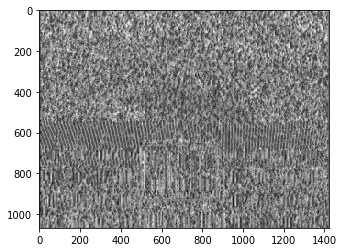

(1068, 1424)
(1, 1068, 1424, 1)
(638, 48, 48, 1)
(638,)
tf.Tensor(0.20445418, shape=(), dtype=float32)
true labels: [1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0]
predicted labels: [1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0]


In [31]:
# similarity threshold to assign labels to results 
threshold = 0.73  # 1-> authentic image, 0 -> falsified image

# true labels to be populated
testLabels = []

# predicted labels to be populated
yLabels = []


print(directorys[0])
for img_name in sorted(os.listdir("./our_dataset_jpeg_31_classifier/test_from_noiseprint/")): #folder
  print(img_name)
  if "a" in img_name:  # authentic image
    testLabels.append(1)
  else:
    testLabels.append(0)

  x = np.array(imread("./our_dataset_jpeg_31_classifier/test_from_noiseprint/"+str(img_name)), dtype=np.float32)/255.0 # already a greyscale image

  show(x)

  width = x.shape[0]
  height = x.shape[1]
  print(x.shape)
  x = np.expand_dims(x,axis= 0) # add dimension for batch
  x = np.expand_dims(x,axis= -1) # add dimension for color channel

  print(x.shape)

  patches = Im2Patch(x,48,48) # no overlapping
  patches = np.moveaxis(patches,3,0)
  patches = np.moveaxis(patches,1,3)

  print(patches.shape)

  out = classifier.call([patches,patches])
  out = tf.squeeze(out)
  print(out.shape)
  val_out = tf.math.reduce_mean(out)
  print(val_out)


  # create label from probability
  if val_out >= threshold:
    yLabels.append(1)
  else:
    yLabels.append(0)

print("true labels: {}".format(testLabels)) 
print("predicted labels: {}".format(yLabels))

def save_result(result, path):
    path = path if path.find('.') != -1 else path+'.png'
    ext = os.path.splitext(path)[-1]
    if ext in ('.txt', '.dlm'):
        np.savetxt(path, result, fmt='%2.4f')
    else:
        # imsave(path, np.clip(result, 0, 1))
        imsave(path, result)

file = open(os.path.join('./results/Classifier/','results.txt'),'a')

for i in range(len(testLabels)):
  result_classifier = "true label: [" + str(testLabels[i]) + "] | predicted label: ["+ str(yLabels[i]) + "] \n"
  file.write(result_classifier)

##Evaluation metrics

Model accuracy -> 0.9166666865348816
Model precision -> 1.0
Model recall -> 0.8333333134651184
Model F1-score -> 0.9090909090909091
Model MCC -> 0.8451542547285166
Model AP -> 0.9166666666666667


Normalized confusion matrix


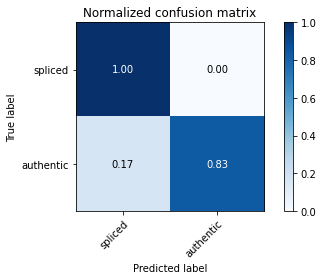

In [35]:
# accuracy
accuracy_calculator = tf.keras.metrics.Accuracy(name="accuracy_calculator", dtype=np.float32)
accuracy_calculator.update_state(testLabels,yLabels)
print("Model accuracy -> {}".format(accuracy_calculator.result().numpy()))

# precision 
precision_calculator = tf.keras.metrics.Precision(name="precision_calculator", dtype=np.float32)
precision_calculator.update_state(testLabels,yLabels)
print("Model precision -> {}".format(precision_calculator.result().numpy()))


# recall 
recall_calculator = tf.keras.metrics.Recall(name="recall_calculator", dtype=np.float32)
recall_calculator.update_state(testLabels,yLabels)
print("Model recall -> {}".format(recall_calculator.result().numpy()))

# F1
F1_score = f1_score(testLabels,yLabels)
print("Model F1-score -> {}".format(F1_score))

# MCC
MCC = matthews_corrcoef(testLabels,yLabels)
print("Model MCC -> {}".format(MCC))

# AP
AP = average_precision_score(testLabels,yLabels)
print("Model AP -> {}".format(AP))

# Confusion matrix
print("\n")
plotConfusions(testLabels,yLabels)